In [1]:
!pip install icecream
!pip install bayesian-optimization

  Created wheel for bayesian-optimization: filename=bayesian_optimization-1.2.0-py3-none-any.whl size=11685 sha256=8e191a0ecc0a108e2002820b32e479f28529a79b6c060cf950ec9acea4131f25
  Stored in directory: /home/jovyan/.cache/pip/wheels/37/fa/19/f93e793d3944567a60b3ab93b446cf7370cc82c60c1d1c613f
Successfully built bayesian-optimization


## df['I']mports

In [2]:
import pandas as pd
import numpy as np
from icecream import ic
from collections import defaultdict
import numba
import matplotlib.pyplot as plt
import math

## df['I']nitial vars

In [3]:
n = int(1e4)
initial_infections = n//2
initial_infections = 3
transmission_prob = 0.05
boredom_prob = 0.001
iterations = 200

## Main loops

### Trade

In [4]:
# %%time

def sell(df, who, world):
    shares_change = df['shares'][who]
    if np.isclose(0, shares_change.sum()):
        return
    alpha = 1 / world['stock_change']
    money_change = world['stock_price'] * (1 - alpha**(shares_change.sum() + 1)) / (1 - alpha)
    ic('sell price per share', money_change / shares_change.sum())
    ic(shares_change.sum())
    df['money'][who] += money_change * shares_change / shares_change.sum()
    df['shares'][who] -= shares_change
    world['stock_cap'] -= money_change.sum()
#     world['stock_price'] = world['stock_cap'] / (df['shares'].sum() + world['stock_shares'])
    world['stock_price'] *= alpha**shares_change.sum()  # TODO: test equivalence
    
def buy(df, who, world):
    money_change = df['money'][who]
    if np.isclose(0, money_change.sum()):
        return
    alpha = world['stock_change']
    shares_change = math.log(1 - (money_change.sum() * (1 - alpha))/ world['stock_price'], alpha) - 1
    ic('by price per share', money_change.sum() / shares_change)
    ic(shares_change)
    df['money'][who] -= money_change
    df['shares'][who] += shares_change * money_change / money_change.sum()
    world['stock_cap'] += money_change.sum()
#     world['stock_price'] = world['stock_cap'] / (df['shares'].sum() + world['stock_shares'])
    world['stock_price'] *= alpha**shares_change  # TODO: test equivalence
    

def debug(df, world):
    fig, axes = plt.subplots(nrows=1,ncols=2, figsize=(16, 5))
    pd.DataFrame(df['money']).plot.hist(title='money', ax = axes[0], logy=True)
    pd.DataFrame(df['shares']).plot.hist(title='shares', ax = axes[1])
    print()
    ic(world['stock_price'])
    ic(world['stock_cap'])
    ic(df['money'].sum())
    
# debug(df, locals())
# tarr = np.zeros(n, dtype=bool)
# buy(df, tarr, locals())
# sell(df, tarr, locals())
# tarr[0] = True
# buy(df, tarr, locals())
# # debug(df, locals())
# # sell(df, tarr, locals())
# debug(df, locals())
# buy(df, np.ones(n, dtype=bool), locals())
# debug(df, locals())
# sell(df, np.ones(n, dtype=bool), locals())
# debug(df, locals())

### df['I']terations

ic| world['stock_price']: 10.0
ic| world['stock_cap']: 1000000.0
ic| df['money'].sum(): 29981835.64328086


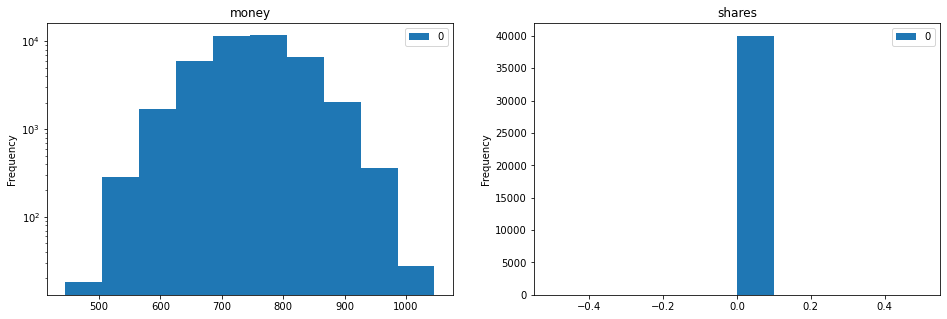

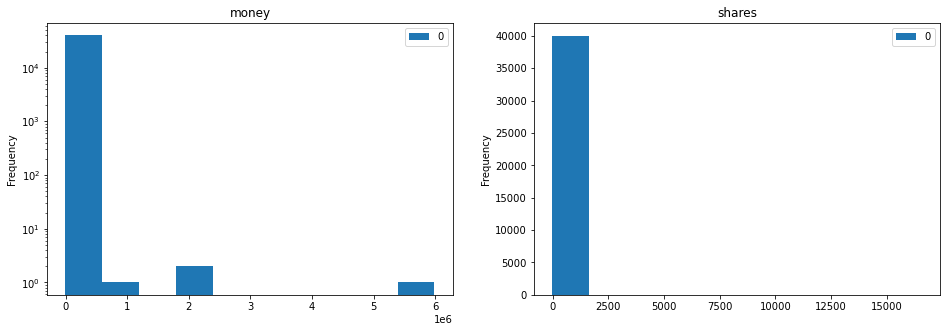

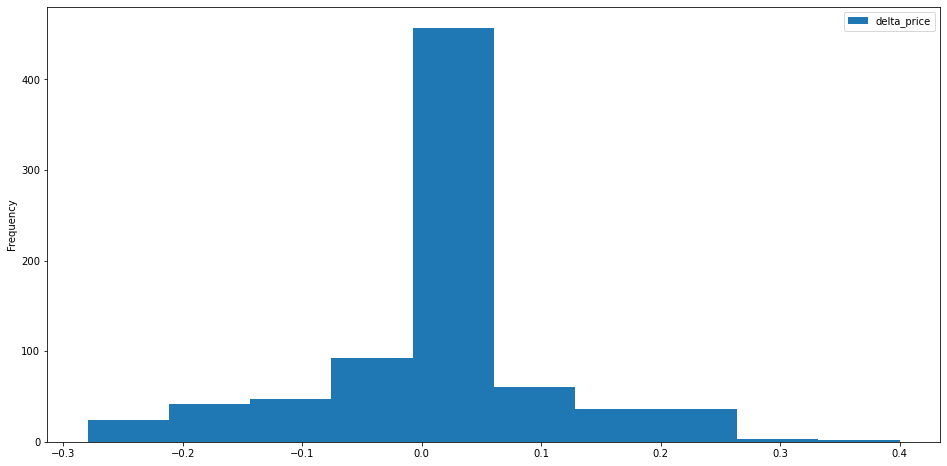

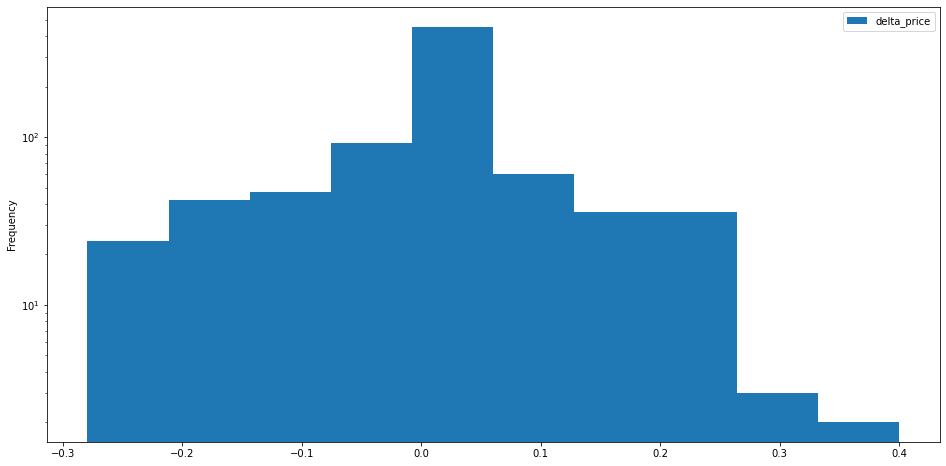

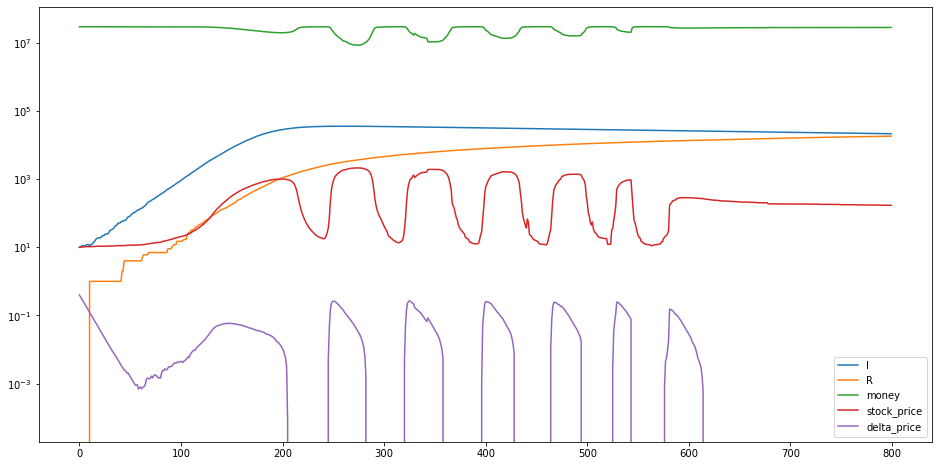

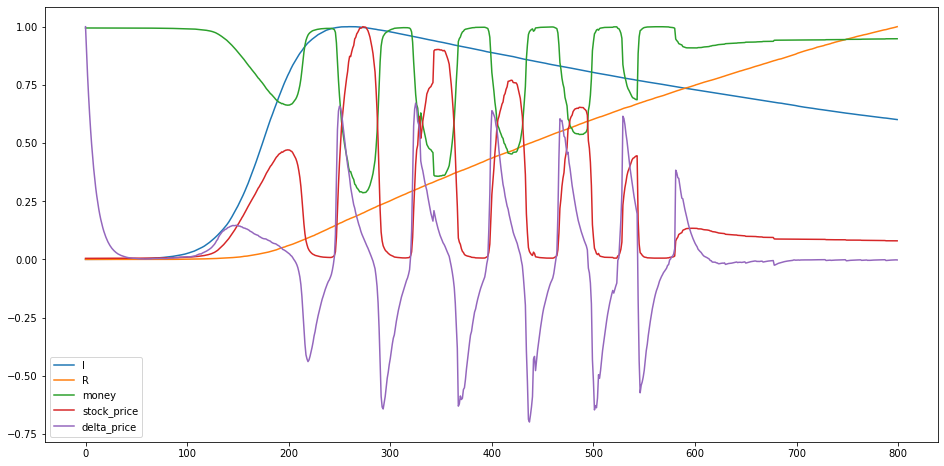

<ipython-input-11-e4f439226133>:116: RuntimeWarning: divide by zero encountered in log10
  df['log10[money]'] = np.log10(df['money'])
<ipython-input-11-e4f439226133>:116: RuntimeWarning: invalid value encountered in log10
  df['log10[money]'] = np.log10(df['money'])


<AxesSubplot:xlabel='optimism', ylabel='log10[money]'>

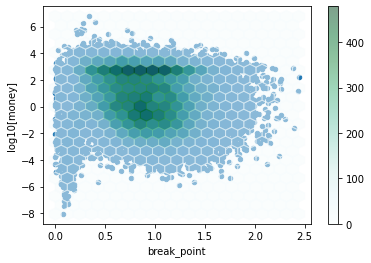

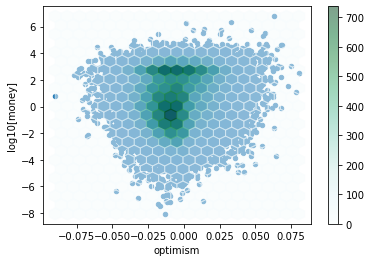

In [11]:
# simulation variables
n = int(4e4)
initial_infections = n//2
initial_infections = 10
transmission_prob = 0.05
boredom_prob = 0.001
iterations = 200

# Stock variables
stock_cap = 1e6
stock_shares = 1e5
stock_price = stock_cap / stock_shares
free_money_multiple = 30
previous_cap = stock_cap
past_impact_weight = 8
mean_break_point = 0.9
delta_price = mean_break_point / 2
eps = 1e-4
stock_change = 1.0001

# Behavior variables
behavior_scale = 5
behavior_linearity = 2
std_optimism = 0.02
std_break_point = 0.4

df = {}

# people property arrays
df['optimism'] = np.random.normal(0, std_optimism, size=n)
df['shares'] = np.zeros(n)
mean_per_person = stock_cap * free_money_multiple / n
df['money'] = abs(np.random.normal(mean_per_person, mean_per_person/10, size=n))
df['break_point'] = abs(np.random.normal(mean_break_point, std_break_point, size=n)) + eps
# pd.DataFrame(df['break_point']).plot.hist()

df['I'] = np.zeros(n, dtype=int)
df['R'] = np.zeros(n, dtype=int)

# df['I']nitial infections
df['I'][:initial_infections] = 1

plot_data = defaultdict(list)
# plot_data = {'I': [], 'R': []}

ic.disable()
ic.enable()

debug(df, locals())


def buy_prob(df, world):
    x = world['delta_price'] + df['optimism']
    mx = x * (((1 - 1 / world['behavior_scale']) ** (1 / world['behavior_linearity'])) / df['break_point'] )
    toLog = 1 / world['behavior_scale'] + abs(mx) ** world['behavior_linearity']
    softClip = - (mx * np.log(toLog) / np.log(world['behavior_scale']))
    return (softClip / (abs(softClip) + 1))# + world['optimism']

def update_market(world):
    delta = 0.0
    try:
        delta = math.log(world['stock_cap'] / world['previous_cap'], 2)
    except ValueError as e:  # TODO: explore -- but so far seems like float64 limited precission of large + small numbers
        pass
#         print(e)
#         print(world['stock_cap'], world['previous_cap'])
    world['delta_price'] = ((world['past_impact_weight'] * world['delta_price'] + delta) / (world['past_impact_weight'] + 1))
    world['previous_cap'] = world['stock_cap']

buy_prob(df, locals())

ic.disable()
# ic.enable()

for i in range(iterations*4):
    transmit_all = np.random.rand(n) > (1-transmission_prob)
    
    transmit = transmit_all * df['I']
    who_to_transmit = (np.random.randint(0, n, n) * transmit)
    df['I'][who_to_transmit] = 1

    to_become_bored = ((np.random.rand(n) > (1-boredom_prob)) * df['I']).astype(bool)
    sell(df, to_become_bored, locals())
    df['R'][to_become_bored] = 1
    df['I'] *= 1 - df['R']
    
    attitude = buy_prob(df, locals())
    who_buys = ((np.random.rand(n) > (1 - attitude)) * df['I']).astype(bool)
    buy(df, who_buys, locals())
    who_sells = ((np.random.rand(n) > (1 + attitude)) * df['I']).astype(bool)
    sell(df, who_sells, locals())
#     debug(df, locals())

    update_market(locals())
    
    plot_data['I'].append(df['I'].sum())
    plot_data['R'].append(df['R'].sum())
    plot_data['money'].append(df['money'].sum())
#     plot_data['shares'].append(df['shares'].sum())
#     plot_data['buys'].append(who_buys.sum())
#     plot_data['sells'].append(who_sells.sum())
    plot_data['stock_price'].append(stock_price)
    plot_data['delta_price'].append(delta_price)
    

debug(df, locals())
plot_df = pd.DataFrame(plot_data)
plot_df[['delta_price']].plot.hist(figsize=(16, 8))
plot_df[['delta_price']].plot.hist(figsize=(16, 8), logy=True)
plt.show()
plot_df.plot(figsize=(16, 8), logy=True)
plot_df = plot_df/plot_df.max()
plot_df.plot(figsize=(16, 8))
plt.show()
plot_df['delta_price'].describe()
df['log10[money]'] = np.log10(df['money'])
ax = pd.DataFrame(df).plot.scatter('break_point', 'log10[money]', logy=False)
pd.DataFrame(df).plot.hexbin('break_point', 'log10[money]', logy=False, gridsize=20, ax=ax, alpha=0.5)
ax = pd.DataFrame(df).plot.scatter('optimism', 'log10[money]', logy=False)
pd.DataFrame(df).plot.hexbin('optimism', 'log10[money]', logy=False, gridsize=20, ax=ax, alpha=0.5)

### Create loss

Peaks are: 7


<AxesSubplot:xlabel='peak', ylabel='stock_price'>

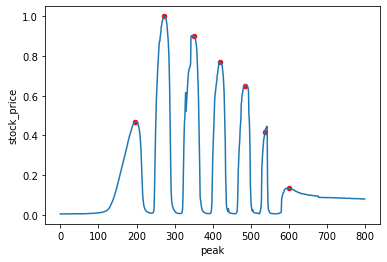

In [12]:
import numpy as np
import scipy.signal

metric_params = {
    'rolling_length': 20,
    'true_peak_dip_ratios': np.array([2, 1, 4, 2, 18, 5, 9, 0, 0, 0]),
    'true_peaks_num': 5,
    'loss_weights': {
        'peaks_num_loss': 0.05,
        'peak_loss': 2,
        'dip_loss': 10,
    }
}

def get_peaks(ser:pd.Series, metric_params):
    vector = ser.rolling(metric_params['rolling_length'], center=True).mean()
    indexes, _ = scipy.signal.find_peaks(vector, height=0.1, distance=1)
    return indexes

indexes = get_peaks(plot_df['stock_price'], metric_params)
print('Peaks are: %s' % (len(indexes)))
plot_df['peak'] = np.nan
plot_df.loc[indexes, 'peak'] = indexes
ax = plot_df['stock_price'].plot()
plot_df.plot.scatter('peak', 'stock_price', c='red', ax = ax)

In [13]:
def max_align(true_y, pred_y):
    pred_y = np.pad(pred_y, len(true_y))
    at = max(0, pred_y.argmax() - true_y.argmax())
    bt = at + len(true_y)
    return pred_y[at:bt]

def compute_loss(plot_df):
    indexes = get_peaks(plot_df['stock_price'], metric_params)
    plot_df['peak'] = np.nan
    plot_df.loc[indexes, 'peak'] = indexes
    
    true_peak_dip_ratios = metric_params['true_peak_dip_ratios']
    true_peak_dip_ratios = true_peak_dip_ratios / true_peak_dip_ratios.max()

    true_peak = true_peak_dip_ratios[::2]
    true_dip = true_peak_dip_ratios[1::2]

    dip = np.array([plot_df.loc[start:end, 'stock_price'].min() 
                   for start, end in zip(indexes, indexes[1:])])

    peak = plot_df.loc[indexes, 'stock_price'].to_numpy()
    pred_peak_dip_ratios = np.zeros(len(dip) + len(peak))
    pred_peak_dip_ratios[::2] = peak
    pred_peak_dip_ratios[1::2] = dip

    pred_peak_dip_ratios = max_align(true_peak_dip_ratios, pred_peak_dip_ratios)
    pred_peak_dip_ratios /= pred_peak_dip_ratios.max()
    pred_peak = pred_peak_dip_ratios[::2]
    pred_dip = pred_peak_dip_ratios[1::2]

    losses = {}
    losses['peaks_num_loss'] = (metric_params['true_peaks_num'] - len(peak))**2
    losses['peak_loss'] = ((pred_peak - true_peak)**2).mean()
    losses['dip_loss'] = ((pred_dip - true_dip)**2).mean()

    for loss_name in losses:
        losses[loss_name] *= metric_params['loss_weights'][loss_name]
        
    return sum(losses.values())

compute_loss(plot_df)

0.7044544948518838

### Auto search loop

-1.2384922642459764

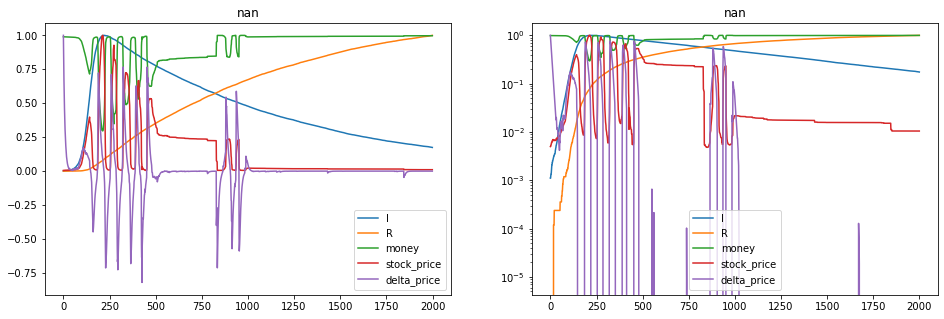

In [23]:
def simulate_market(df, world):
    plot_data = defaultdict(list)
    
    for i in range(int(world['iterations'])):
        n = world['n']
        transmit_all = np.random.rand(n) > (1-world['transmission_prob'])

        transmit = transmit_all * df['I']
        who_to_transmit = (np.random.randint(0, n, n) * transmit)
        df['I'][who_to_transmit] = 1

        to_become_bored = ((np.random.rand(n) > (1-world['boredom_prob'])) * df['I']).astype(bool)
        sell(df, to_become_bored, world)
        df['R'][to_become_bored] = 1
        df['I'] *= 1 - df['R']

        attitude = buy_prob(df, world)
        who_buys = ((np.random.rand(n) > (1 - attitude)) * df['I']).astype(bool)
        buy(df, who_buys, world)
        who_sells = ((np.random.rand(n) > (1 + attitude)) * df['I']).astype(bool)
        sell(df, who_sells, world)

        update_market(world)

        plot_data['I'].append(df['I'].sum())
        plot_data['R'].append(df['R'].sum())
        plot_data['money'].append(df['money'].sum())
    #     plot_data['shares'].append(df['shares'].sum())
    #     plot_data['buys'].append(who_buys.sum())
    #     plot_data['sells'].append(who_sells.sum())
        plot_data['stock_price'].append(world['stock_price'])
        plot_data['delta_price'].append(world['delta_price'])
            
    return plot_data

def test_hypervars(plot=False, return_df=False, repetitions=7, **kwargs):
    losses = []
    for i in range(repetitions):
        # simulation variables
        n = int(1e4)
        initial_infections = n//2
        initial_infections = 10
        transmission_prob = 0.05
        boredom_prob = 0.001
        iterations = 2000

        # Stock variables
        stock_cap = 1e6
        stock_shares = 1e5
        stock_price = stock_cap / stock_shares
        free_money_multiple = 30
        previous_cap = stock_cap
        past_impact_weight = 8
        mean_break_point = 0.9
        delta_price = mean_break_point / 2
        eps = 1e-4
        stock_buy_extra = 0.0001
        free_money_lambda = 0.01

        # Behavior variables
        behavior_scale = 5
        behavior_linearity = 2
        std_optimism = 0.02
        std_break_point = 0.4
        
        # Other
        title = np.nan

        world = locals()
        world.update(kwargs)
        world.update({key[:-4]: 10**val for key, val in kwargs.items() if key[-4:] == '_exp'})
        world['stock_change'] = 1 + world['stock_buy_extra']
        
        df = {}

        # people property arrays
        df['optimism'] = np.random.normal(0, world['std_optimism'], size=world['n'])
        df['shares'] = np.zeros(world['n'])
        mean_per_person = world['stock_cap'] * world['free_money_multiple'] / world['n']
#         df['money'] = abs(np.random.normal(mean_per_person, mean_per_person/10, size=world['n']))
        df['money'] = abs(np.random.exponential(world['free_money_lambda'], size=world['n']))
        df['money'] *= mean_per_person / df['money'].mean()
        df['initial_money'] = df['money'].copy()
        df['break_point'] = abs(np.random.normal(world['mean_break_point'], world['std_break_point'], size=world['n'])) + eps

        df['I'] = np.zeros(world['n'], dtype=int)
        df['R'] = np.zeros(world['n'], dtype=int)

        df['I'][:world['initial_infections']] = 1

        loss = 1e5
        try:
            plot_data = simulate_market(df, world)
            raw_plot_df = pd.DataFrame(plot_data)
            plot_df = raw_plot_df/raw_plot_df.max()
            loss = compute_loss(plot_df.copy())
            if math.isnan(loss):
                loss = 1e4
            if return_df:
                return {
                    'df': raw_plot_df, 'investors': df,                    
                }
            if plot:
                fig, axes = plt.subplots(nrows=1,ncols=2, figsize=(16, 5))
                plot_df.plot(title=world['title'], ax = axes[0])
                plot_df.plot(title=world['title'], ax = axes[1], logy=True)
                losses.append(loss)
                break
        except ValueError as e:
#             print(e)
            pass
        losses.append(loss)
    return -sum(losses) / len(losses)
    
ic.disable()
test_hypervars(past_impact_weight=7, plot=True, stock_change_exp=-3.1, free_money_lambda=0.00001)

### Perform search

In [6]:
%%time
from bayes_opt import BayesianOptimization

# Bounded region of parameter space
widest_pbounds = {
    'past_impact_weight': (1, 80), 
    'mean_break_point_exp': (-2, 0),
    'std_optimism_exp': (-3, 0),
    'free_money_multiple': (1, 60),
    'behavior_scale': (1, 50),
    'behavior_linearity_exp': (-3, 2),
    'std_break_point_exp': (-3, 0),
    'stock_buy_extra_exp': (-6, -2),
    'boredom_prob_exp': (-4, -1),
    'transmission_prob_exp': (-3, -0.9),
    'iterations': (800, 1200),
    'delta_price_exp': (-6, -1)
}

pbounds = {
    'past_impact_weight': (1, 80), 
    'mean_break_point_exp': (-2, 0),
    'std_optimism_exp': (-3, 0),
    'free_money_multiple': (0.1, 100),
    'behavior_scale': (1, 50),
    'behavior_linearity_exp': (-1, 2),
    'std_break_point_exp': (-3, 0),
    'stock_buy_extra_exp': (-6, -2),
    'boredom_prob_exp': (-4, -2),
    'transmission_prob_exp': (-2, -0.9),
    'delta_price_exp': (-6, 0)
}

CPU times: user 338 ms, sys: 807 ms, total: 1.15 s
Wall time: 302 ms


In [ ]:
optimizer = BayesianOptimization(
    f=test_hypervars,
    pbounds=pbounds,
    random_state=1,
)

optimizer.maximize(
    init_points=700,
    n_iter=3000,
)

## Explore results

In [ ]:
test_hypervars(**optimizer.max['params'], plot=True)

### Explore param:target trends

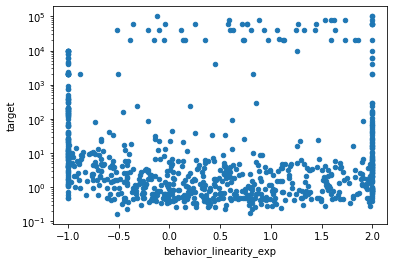

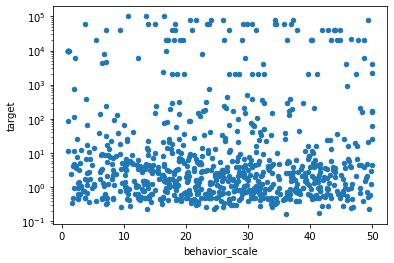

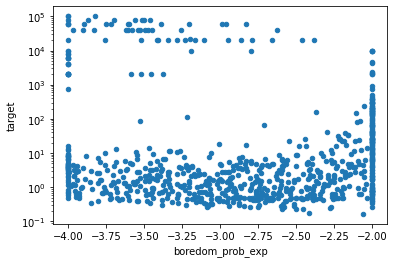

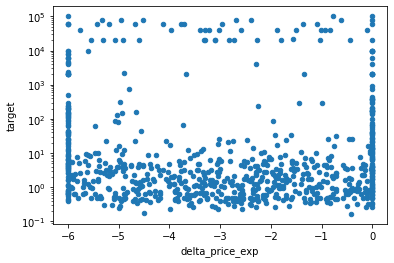

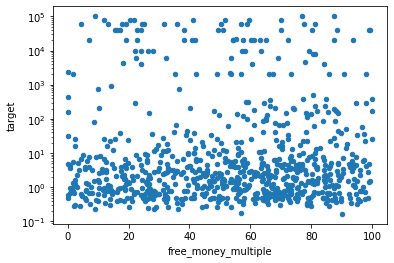

...

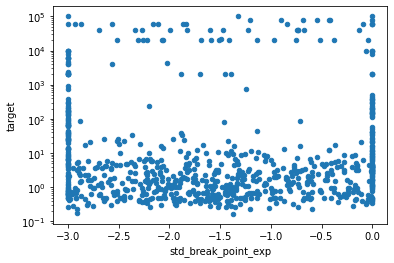

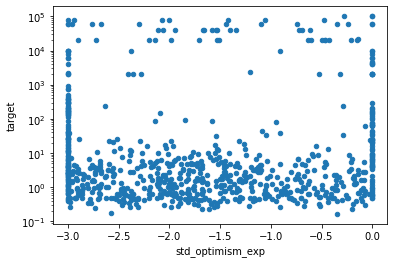

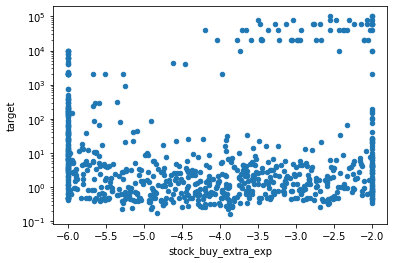

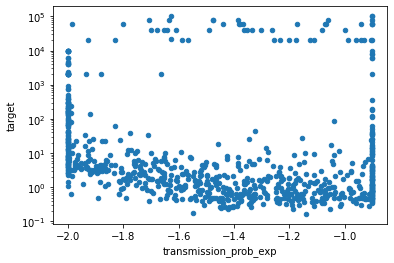

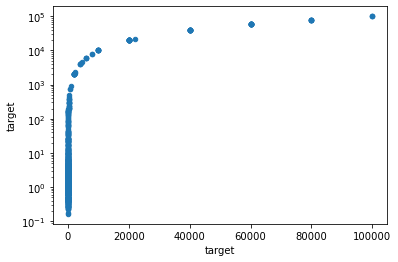

In [578]:
df = tdf.params.apply(pd.Series)
df['target'] = -tdf.target
df = df[df.target < 500000000]

for col in df.columns:
    df.plot.scatter(col, 'target', logy=True)

### Images

<ipython-input-575-604589a32a38>:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrows=1,ncols=2, figsize=(16, 5))


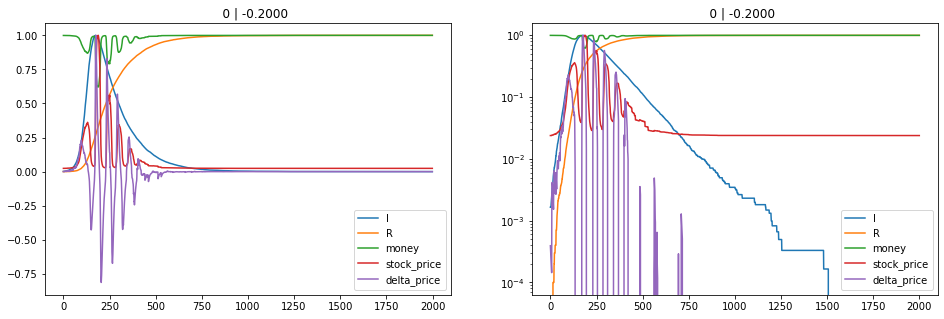

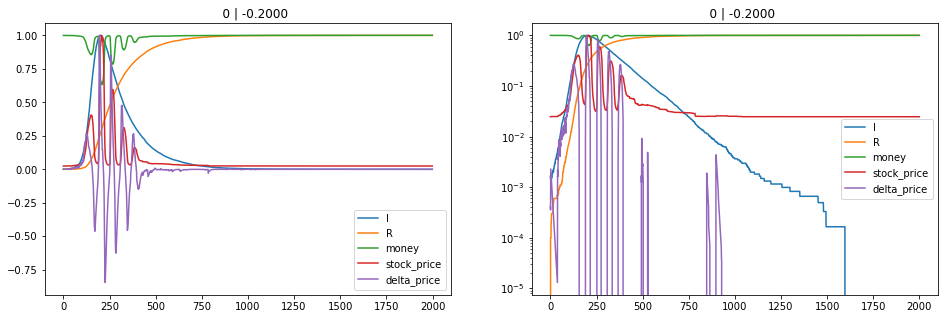

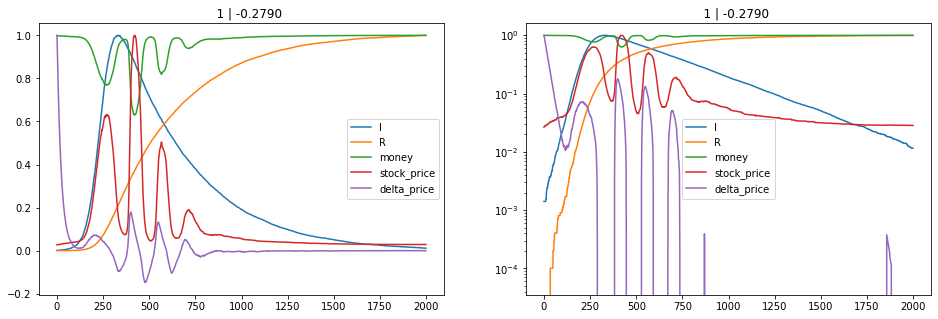

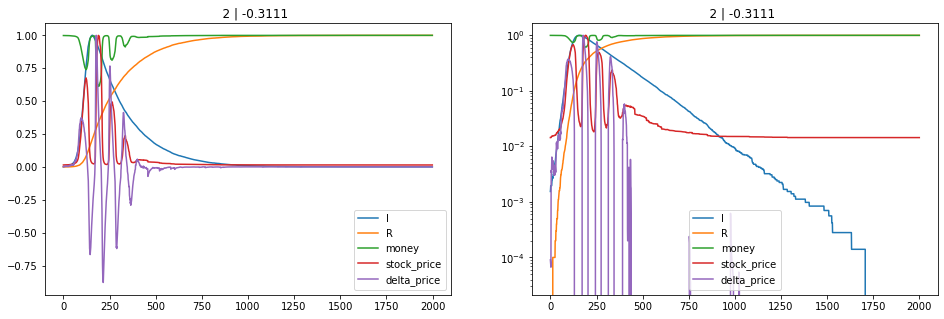

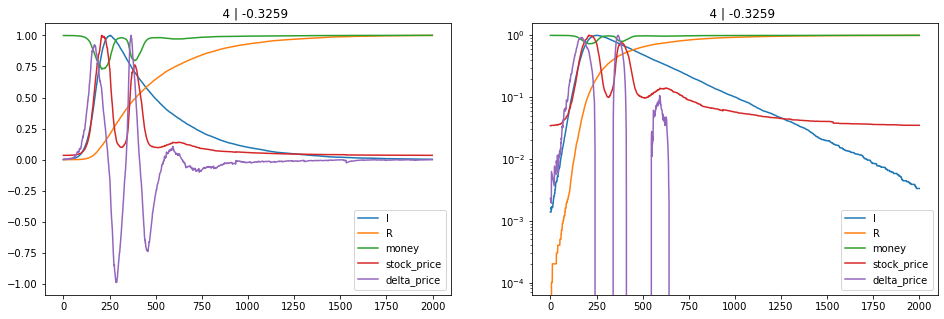

...

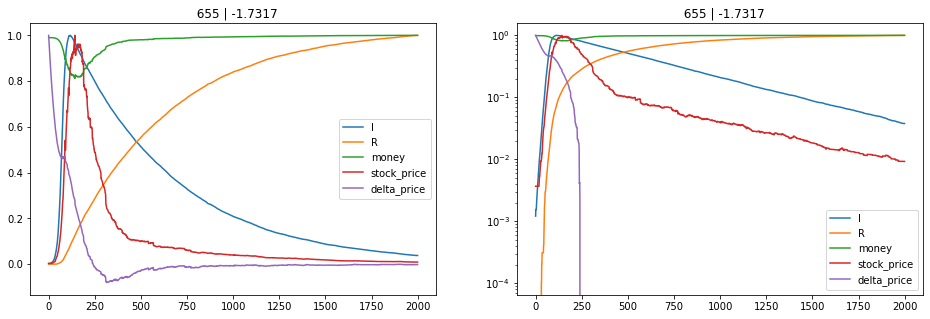

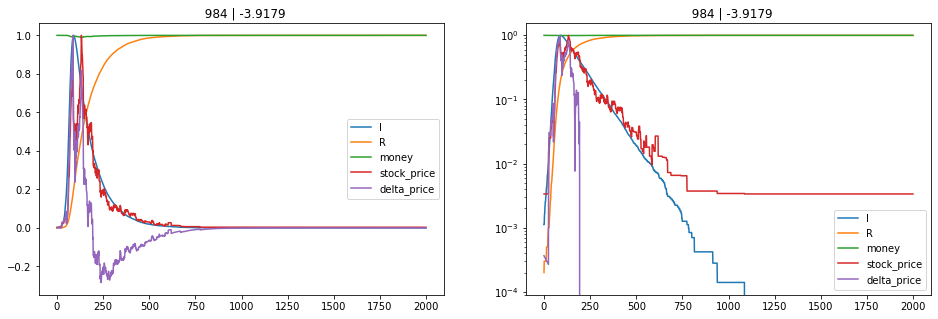

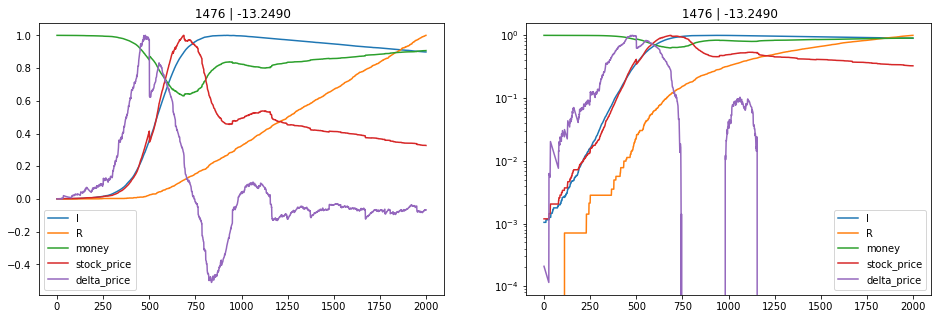

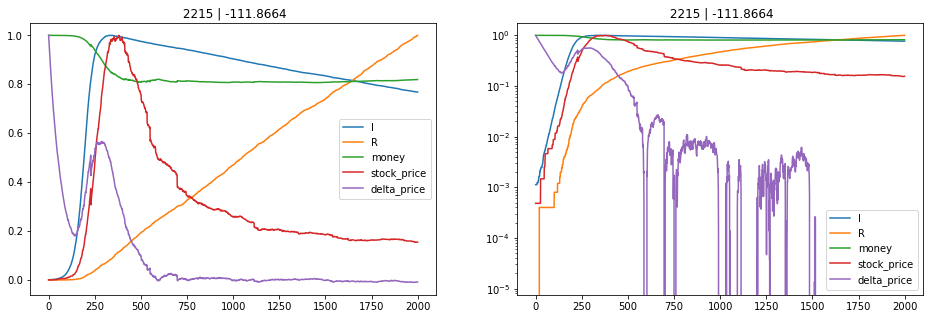

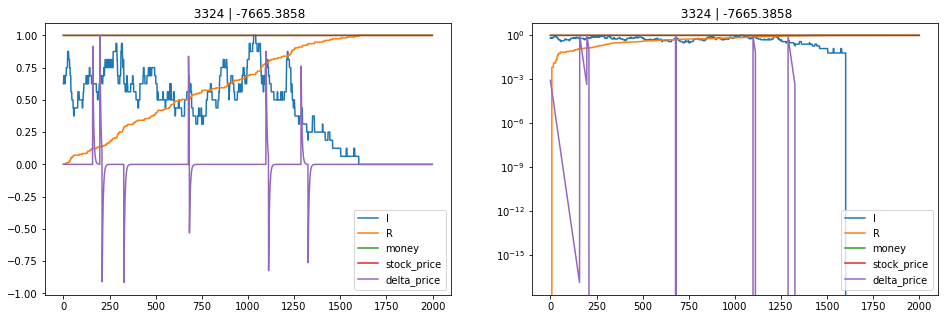

In [579]:
tdf = pd.DataFrame(optimizer.res).sort_values('target', ascending=False)
params = tdf.params
base = 1.5
for i in (base**np.arange(abs(math.log(len(params), base)))).astype(int)-1:
    test_hypervars(**tdf.params.iloc[i], plot=True, title=f'{i:5} | {tdf.target.iloc[i]:2.4f}')

In [580]:
tdf.iloc[(base**np.arange(abs(math.log(len(params), base)))).astype(int)-1].to_numpy()

array([[-0.19998027351180342,
        {'behavior_linearity_exp': 0.6326345569971692, 'behavior_scale': 35.395661429101864, 'boredom_prob_exp': -2.1352675373442596, 'delta_price_exp': -3.9277933940522023, 'free_money_multiple': 51.62010278945161, 'mean_break_point_exp': -0.42681728767076854, 'past_impact_weight': 6.483396390318244, 'std_break_point_exp': -0.740335890496536, 'std_optimism_exp': -2.647561737821957, 'stock_buy_extra_exp': -4.443479781579008, 'transmission_prob_exp': -1.2333078442284797}],
       [-0.19998027351180342,
        {'behavior_linearity_exp': 0.6326345569971692, 'behavior_scale': 35.395661429101864, 'boredom_prob_exp': -2.1352675373442596, 'delta_price_exp': -3.9277933940522023, 'free_money_multiple': 51.62010278945161, 'mean_break_point_exp': -0.42681728767076854, 'past_impact_weight': 6.483396390318244, 'std_break_point_exp': -0.740335890496536, 'std_optimism_exp': -2.647561737821957, 'stock_buy_extra_exp': -4.443479781579008, 'transmission_prob_exp': -1.233307

-0.2630627590215966

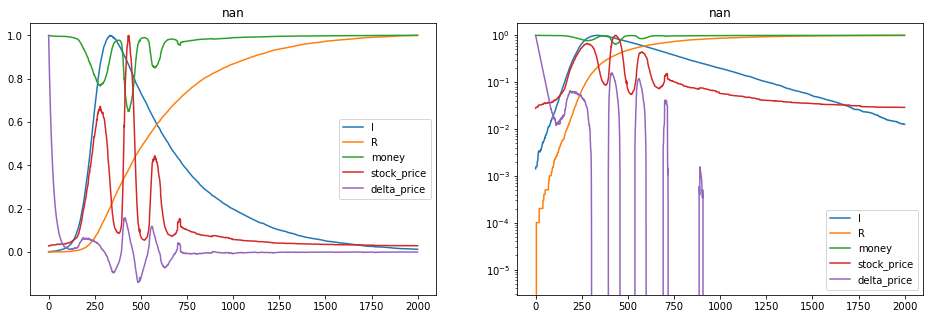

In [27]:
nice_params = {'behavior_linearity_exp': -0.17764067449944354, 'behavior_scale': 28.46596953626688, 'boredom_prob_exp': -2.656540430365159, 
               'delta_price_exp': -3.885422218701547, 'free_money_multiple': 85.59725388866738, 'iterations': 2000.0299888069658, 
               'mean_break_point_exp': -0.5053583793361536, 'past_impact_weight': 23.878616948763316, 
               'std_break_point_exp': -0.6786021382674541, 'std_optimism_exp': -1.7167880119917713, 
               'stock_buy_extra_exp': -2.769206363551162, 'transmission_prob_exp': -1.6111116510652106}

nice_params = {'behavior_linearity_exp': 1.0320255797616666, 'behavior_scale': 16.760885575207098, 
               'boredom_prob_exp': -2.5786692066676054, 'delta_price_exp': -0.39336240792311106, 
               'past_impact_weight': 22.021992339162843, 'stock_buy_extra_exp': -4.475804412574341, 
               'transmission_prob_exp': -1.498678451731266}

test_hypervars(free_money_lambda=1e-1, **nice_params, plot=True)

### Substitution study per example

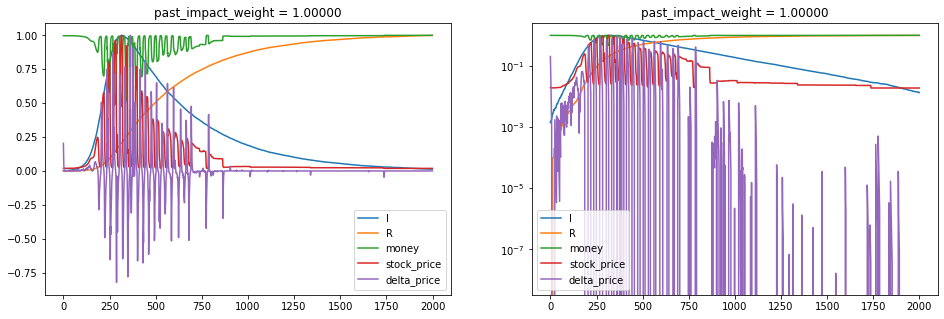

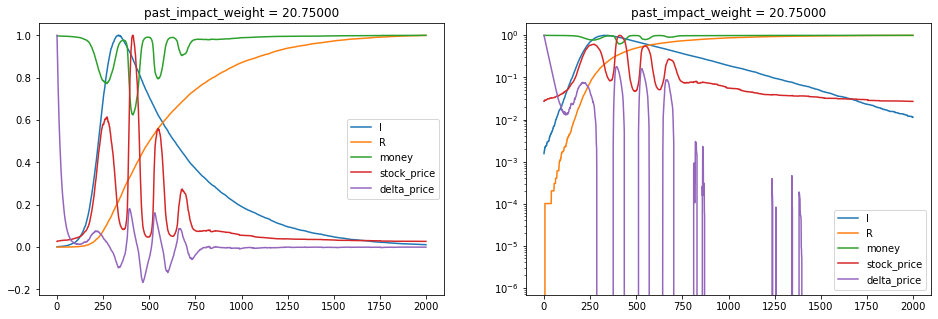

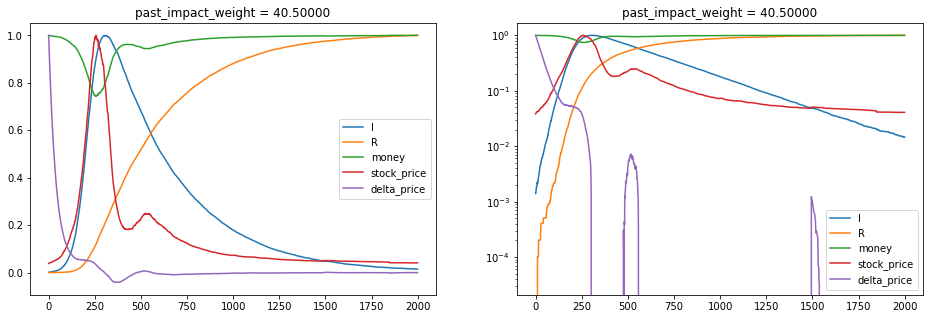

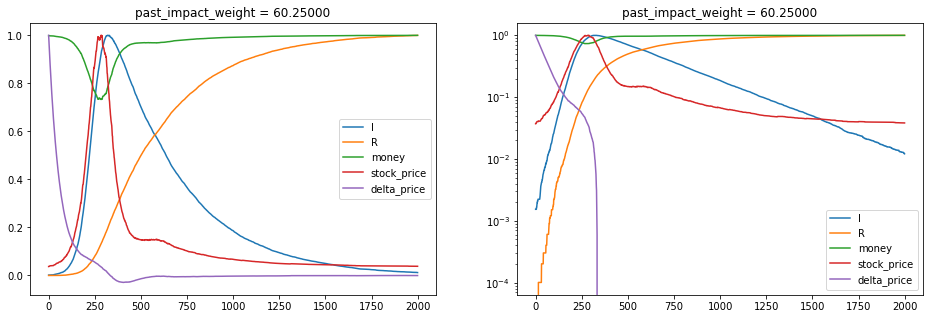

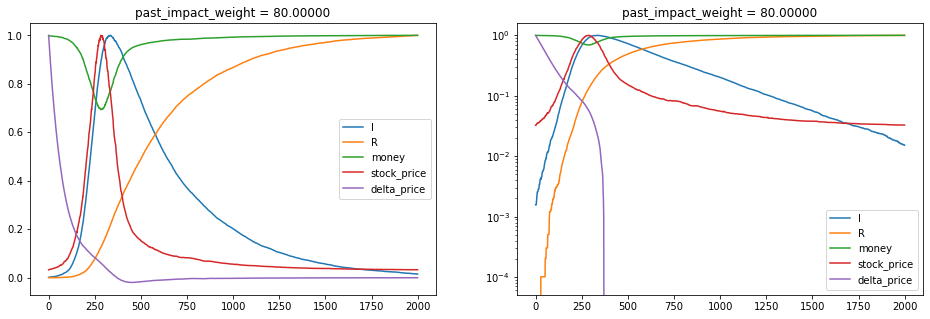

...

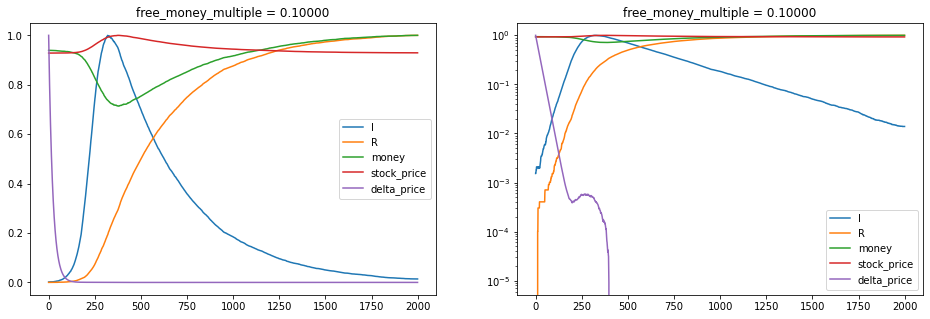

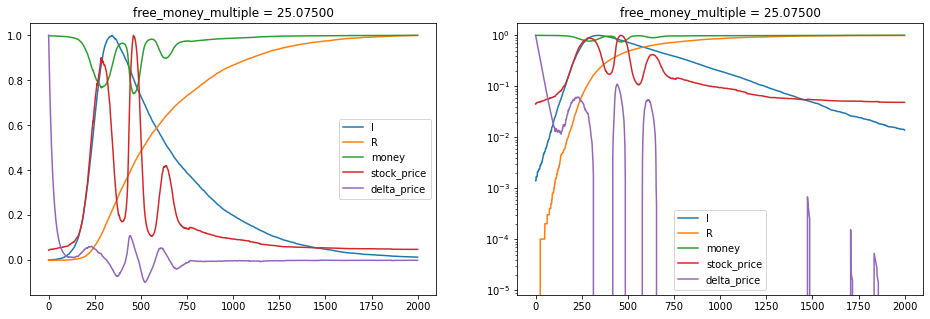

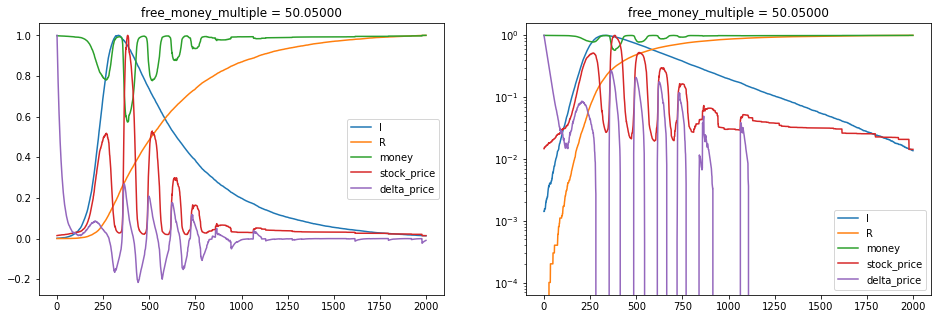

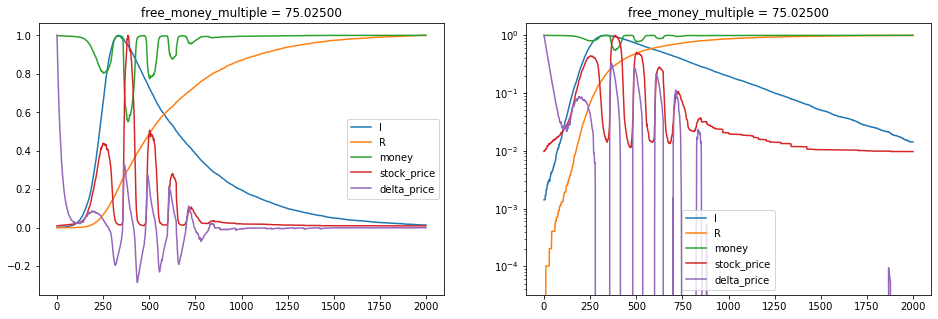

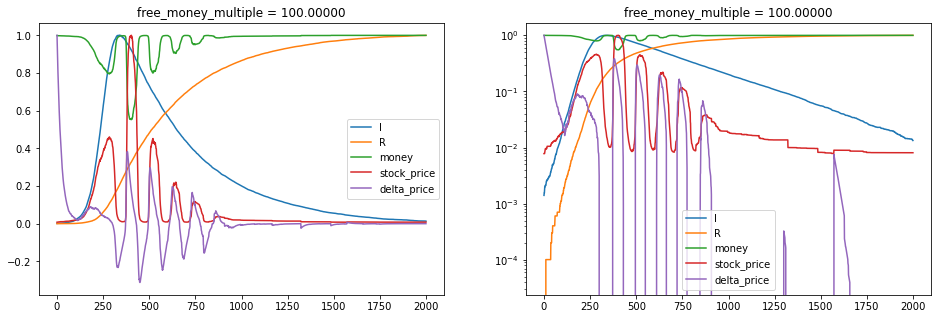

<ipython-input-40-e4f439226133>:56: RuntimeWarning: invalid value encountered in true_divide
  softClip = - (mx * np.log(toLog) / np.log(world['behavior_scale']))
<ipython-input-12-a9e08cce0647>:27: RuntimeWarning: invalid value encountered in true_divide
  pred_peak_dip_ratios /= pred_peak_dip_ratios.max()


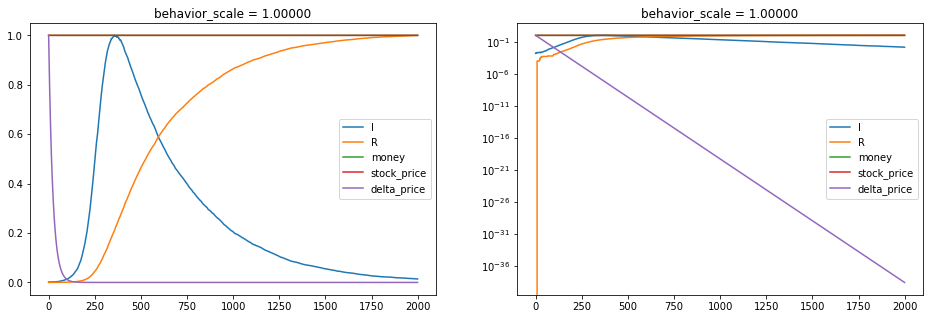

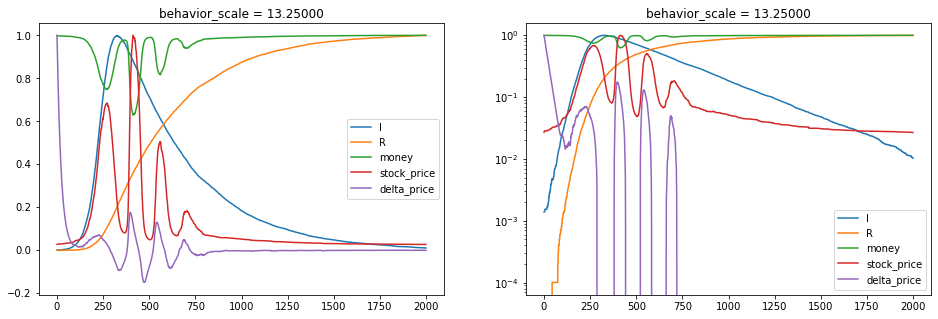

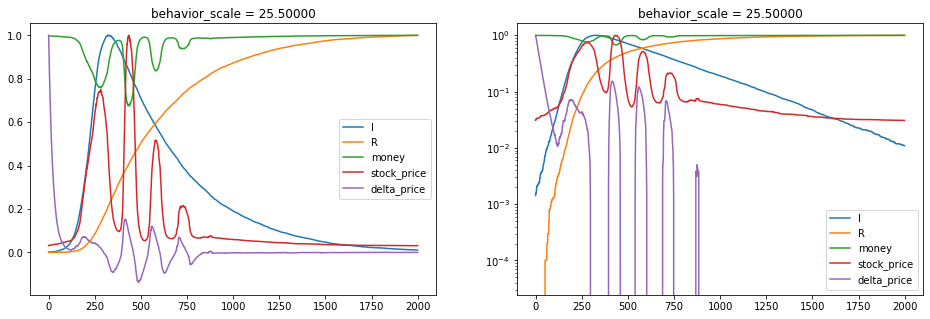

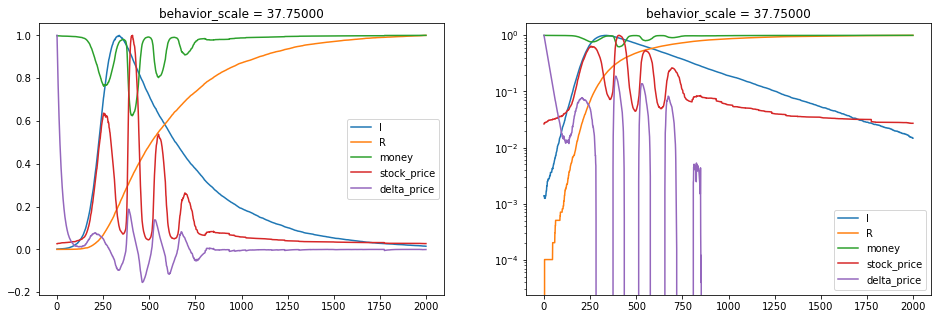

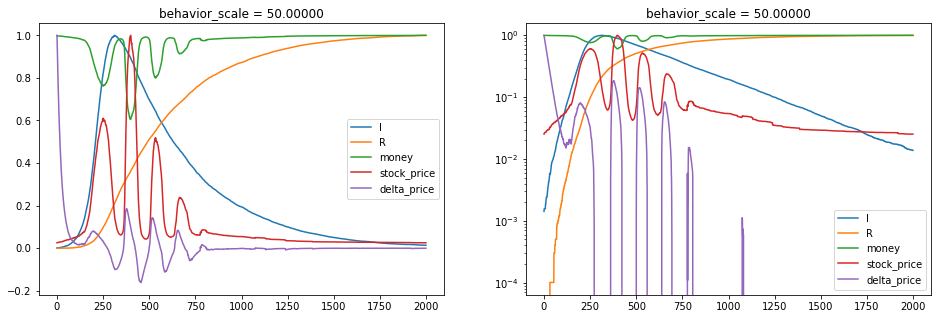

...

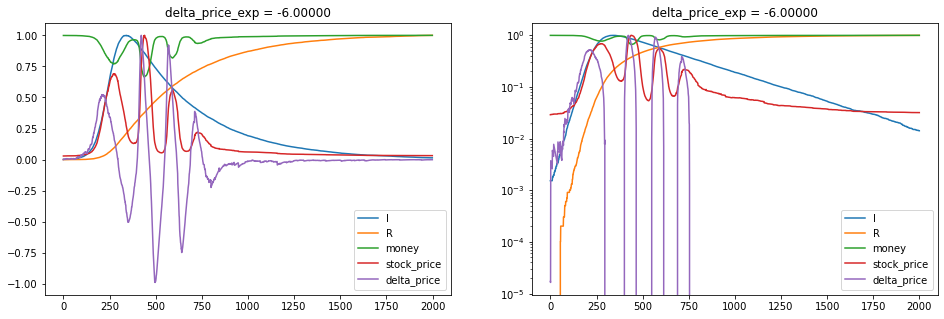

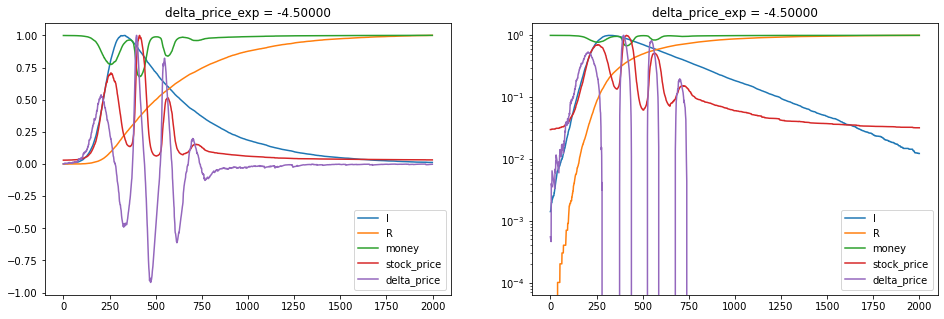

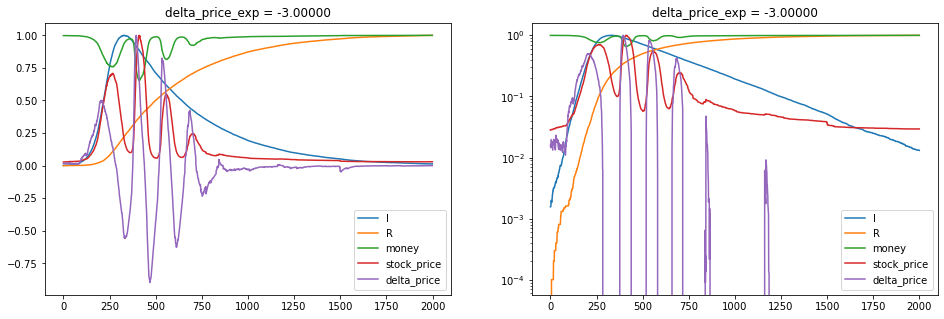

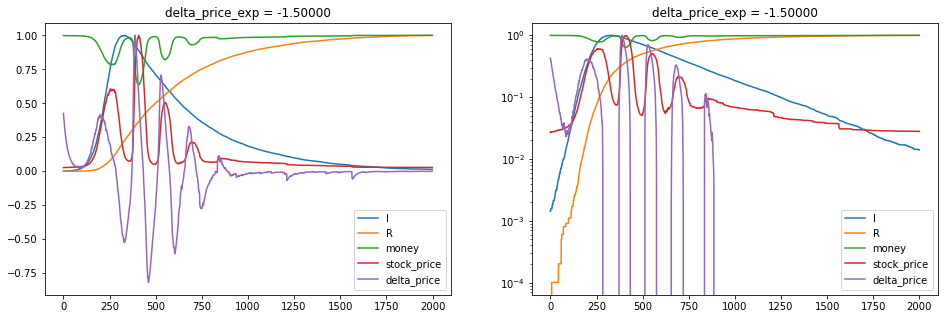

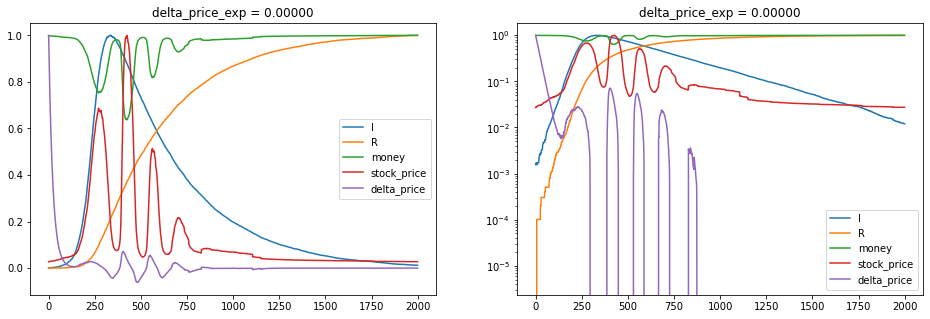

In [41]:
from copy import copy
parts = 5

for name, vals in pbounds.items():
    plt.show()
    for part in range(parts):
        params = copy(nice_params)
        params[name] = vals[0] + (vals[1] - vals[0]) * part / (parts - 1)
        test_hypervars(**params, plot=True, title=f'{name} = {params[name]:2.5f}')
        


# for free_money_multiple in [0.1, 1, 5, 10, 40, 80, 120]:
#     params = copy(nice_params)
#     params['free_money_multiple'] = free_money_multiple
#     test_hypervars(**nice_params, plot=True, title=free_money_multiple)

### Substitution study agromerative

In [95]:
gold_plot_df = test_hypervars(**nice_params, return_df=True)

In [340]:
nice_params

{'behavior_linearity_exp': 1.0320255797616666,
 'behavior_scale': 16.760885575207098,
 'boredom_prob_exp': -2.5786692066676054,
 'delta_price_exp': -0.39336240792311106,
 'past_impact_weight': 22.021992339162843,
 'stock_buy_extra_exp': -4.475804412574341,
 'transmission_prob_exp': -1.498678451731266}

In [361]:
from tqdm import tqdm 
from collections import defaultdict
import multiprocessing

def compute_hyperparam_subspace(args):
    res = defaultdict(dict)
    name, vals = args
    parts = 1000
    plt.show()
    for part in tqdm(range(parts), desc=f'{name}'):
        params = copy(nice_params)
        params['iterations'] = 2000
        params[name] = vals[0] + (vals[1] - vals[0]) * part / (parts - 1)
        res[name][params[name]] = test_hypervars(**params, return_df=True)
    return res

with multiprocessing.Pool() as p:
#     res = list(tqdm(p.imap(compute_hyperparam_subspace, pbounds.items()), total=len(pbounds.items()), desc='bounds'))
    res = p.map(compute_hyperparam_subspace, pbounds.items())
    
res = {list(x.keys())[0]: list(x.values())[0] for x in res}

transmission_prob_exp:   0%|          | 0/1000 [00:00<?, ?it/s]]<ipython-input-40-e4f439226133>:56: RuntimeWarning: invalid value encountered in true_divide
  softClip = - (mx * np.log(toLog) / np.log(world['behavior_scale']))
past_impact_weight:   0%|          | 1/1000 [00:01<30:18,  1.82s/it]]it]<ipython-input-12-a9e08cce0647>:27: RuntimeWarning: invalid value encountered in true_divide
  pred_peak_dip_ratios /= pred_peak_dip_ratios.max()
behavior_linearity_exp: 100%|█████████▉| 996/1000 [35:10<00:09,  2.32s/it]<ipython-input-40-e4f439226133>:55: RuntimeWarning: overflow encountered in power
  toLog = 1 / world['behavior_scale'] + abs(mx) ** world['behavior_linearity']
<ipython-input-40-e4f439226133>:57: RuntimeWarning: invalid value encountered in true_divide
  return (softClip / (abs(softClip) + 1))# + world['optimism']
boredom_prob_exp: 100%|██████████| 1000/1000 [37:30<00:00,  2.25s/it]


In [359]:
def plot_with_std(mean_, std_, col, ax=None, **kwargs):
    ax = mean_[[col]].plot(figsize=figsize, ax=ax, **kwargs)
    yerr = std_[col]*2
    x = mean_.index.to_numpy()
    y = mean_[col]
    alpha_fill = 0.2
    if np.isscalar(yerr) or len(yerr) == len(y):
        ymin = y - yerr
        ymax = y + yerr
    elif len(yerr) == 2:
        ymin, ymax = yerr
    ax.fill_between(x, ymax, ymin, alpha=alpha_fill)
    return ax

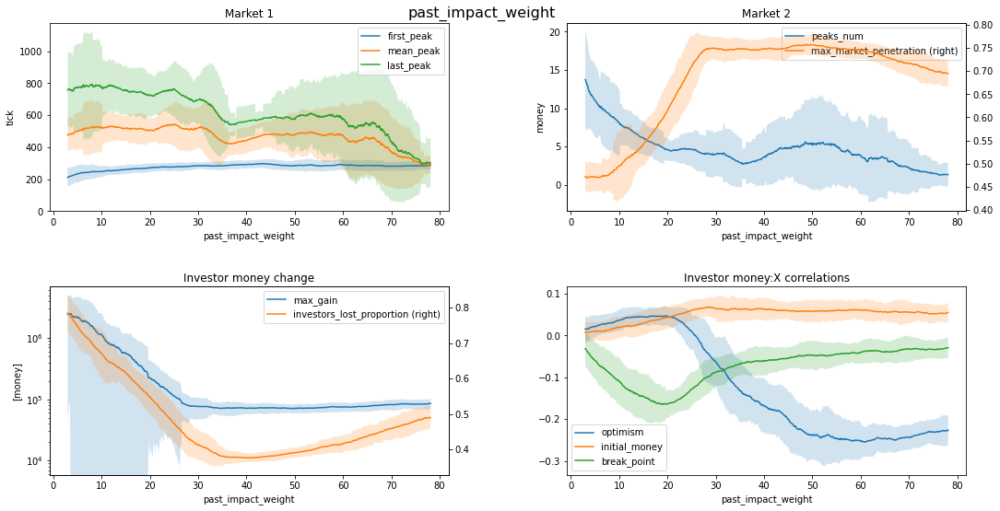

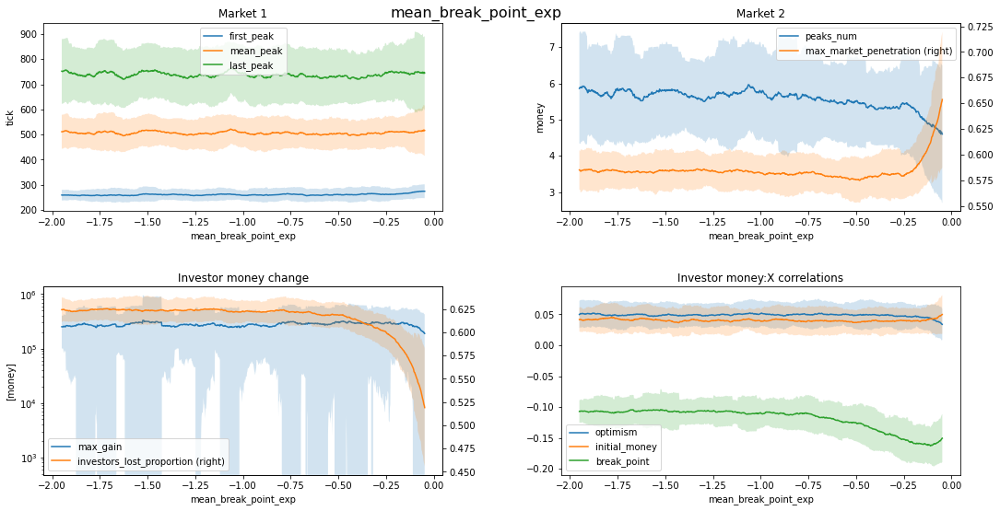

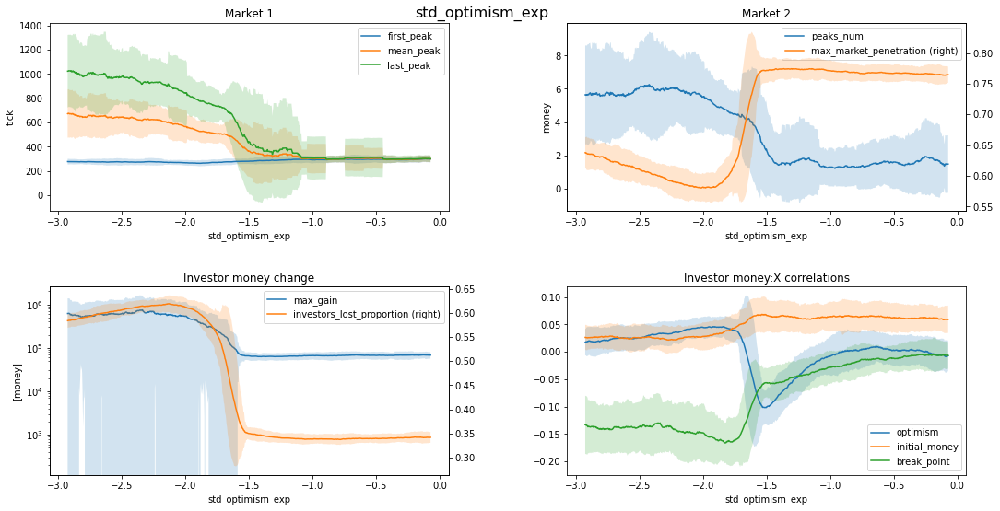

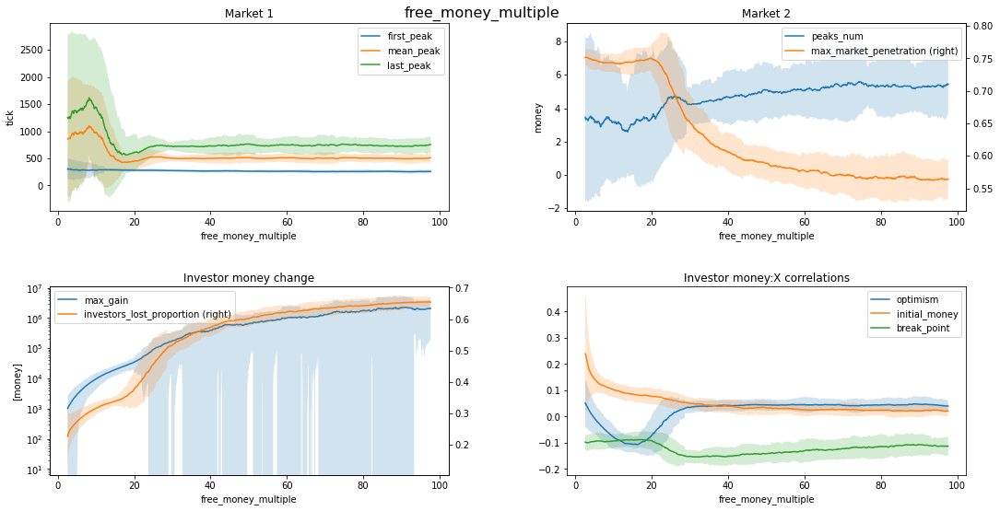

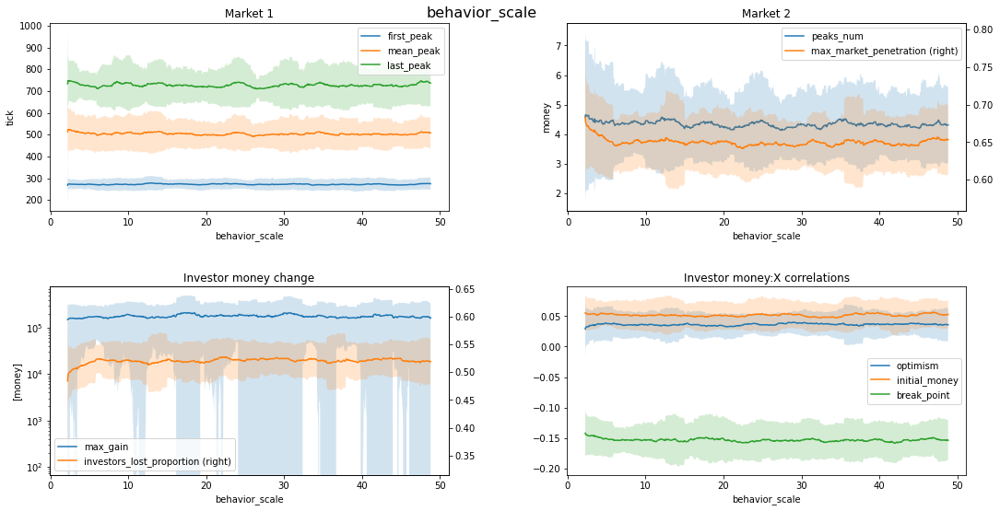

...

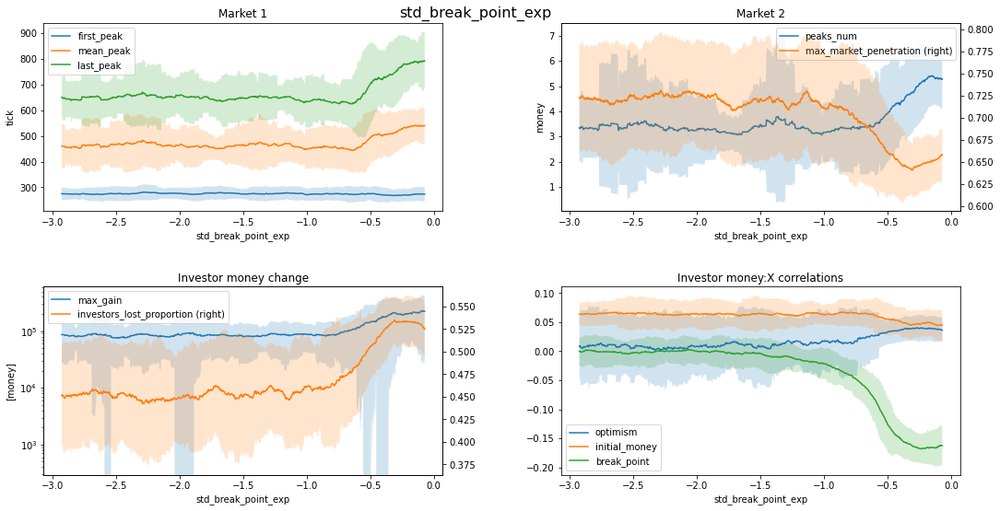

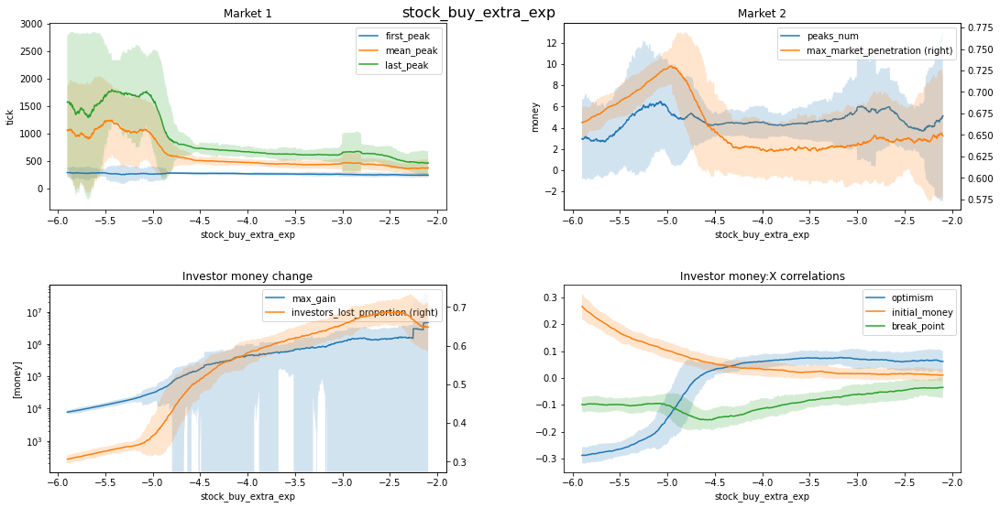

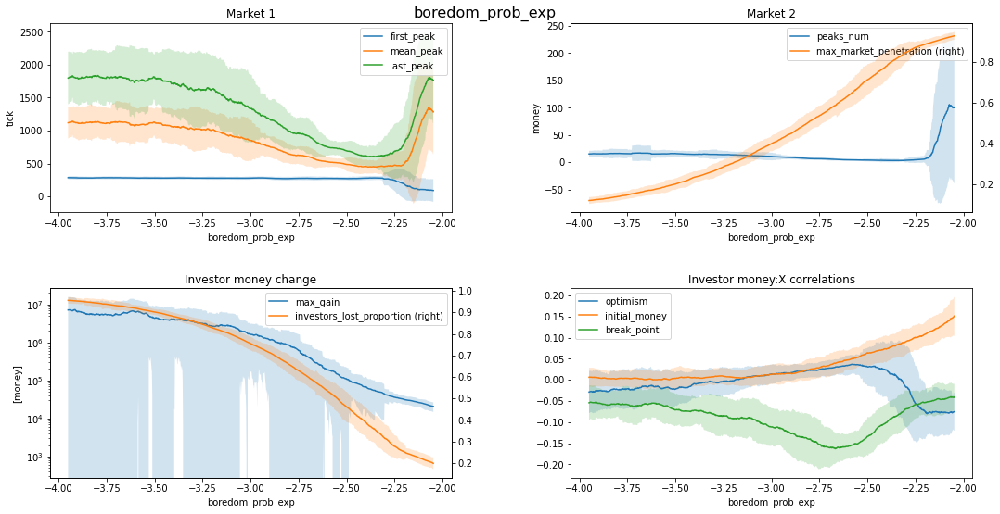

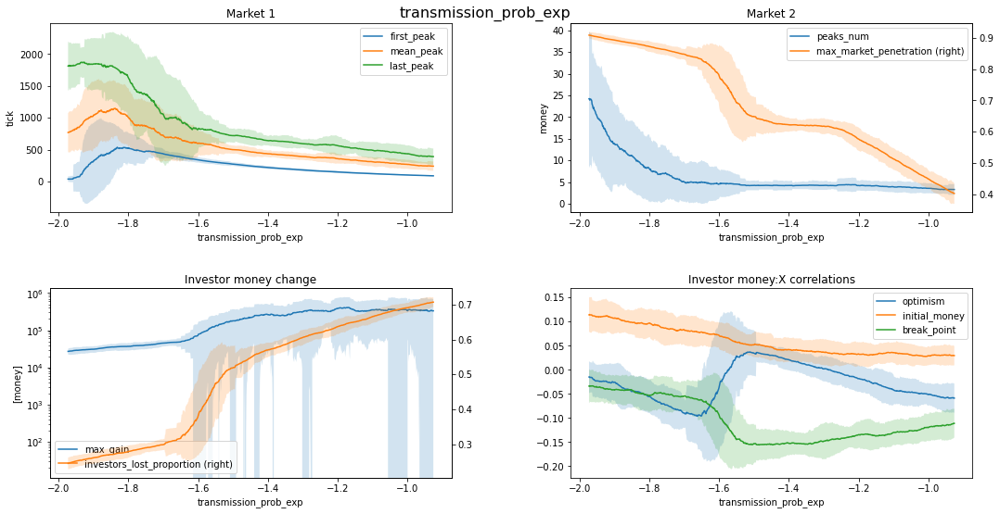

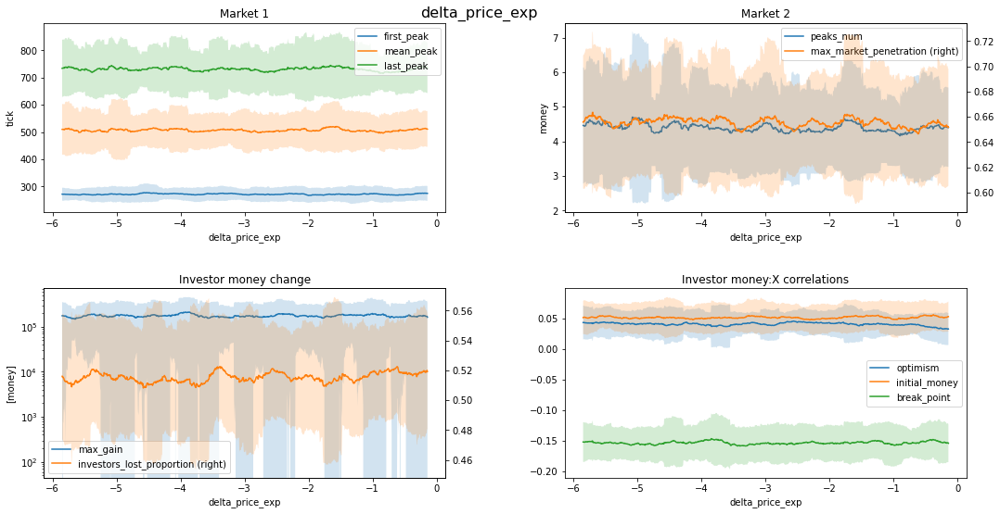

In [364]:
from scipy.stats import kstest

def plot_hyper_change_agglomerated(res_):
    df = pd.DataFrame([x for x in res_.values()], index=res_.keys())
    
    # Market markers
    df['peaks'] = df.df.map(lambda cell: get_peaks(cell['stock_price']/cell['stock_price'].max(), metric_params))
    df['last_peak'] = df.peaks.map(lambda cell: cell[-1] if len(cell) > 0 else 0)
    df['first_peak'] = df.peaks.map(lambda cell: cell[0] if len(cell) > 0 else 0)
    df['mean_peak'] = df.peaks.map(lambda cell: cell.mean() if len(cell) > 0 else 0)
    df['peaks_num'] = df.peaks.str.len()
    df['ks_stat'] = df.df.map(lambda cell: kstest(cell['stock_price'], gold_plot_df['stock_price'])[0])
    df['max_market_penetration'] = df.df.map(lambda cell: cell['money'].min()/cell['money'].max())
    
    # Investor markers
    df.investors = df.investors.map(lambda cell: pd.DataFrame(cell))
    df['max_gain'] = df.investors.map(lambda cell: cell['money'].max())
    df['investors_lost_proportion'] = df.investors.map(lambda cell: ((cell['money'] - cell['initial_money'])  < 0).sum() / len(cell['money']))
    tmp = df.investors.map(lambda cell: cell[cell.money != cell.initial_money].corr()['money'].drop(['I', 'R', 'shares', 'money']).to_dict()).to_list()
    df = pd.concat([df, pd.DataFrame(tmp, index=df.index)], axis=1)
    
    figsize = (16, 8)
    roll_df = df.rolling(max(1, len(df)//20), center=True)

    color = None
    mean = roll_df.mean()
    std = roll_df.std()

    fig, ax_arr = plt.subplots(2, 2)
    fig.tight_layout(h_pad=2)
    fig.suptitle(name, fontsize=16)
#     ax_arr = [[None,] * 2] * 2
    ax = ax_arr[0][0]
    for col in ['first_peak', 'mean_peak', 'last_peak']:
        ax = plot_with_std(mean, std, col, ax=ax, xlabel=name, ylabel='tick', title='Market 1')

    ax = ax_arr[0][1]
    ax = plot_with_std(mean, std, 'peaks_num', ax=ax,  ylabel='# peaks', title='Market 2')
    plot_with_std(mean, std, 'max_market_penetration', ax=ax, secondary_y=True, xlabel=name, ylabel='money')
    
    ax = ax_arr[1][0]
    for col in ['max_gain', ]:
        ax = plot_with_std(mean, std, col, xlabel=name, ax=ax, ylabel='[money]', logy=True, title='Investor money change')
    ax = plot_with_std(mean, std, 'investors_lost_proportion', xlabel=name, ax=ax, ylabel='[money]', secondary_y=True, )
    
    ax = ax_arr[1][1]
    for col in ['optimism', 'initial_money', 'break_point']:
        ax = plot_with_std(mean, std, col, xlabel=name, ax=ax, ylabel='', title='Investor money:X correlations')
        
    
for name in list(res)[:]:
    plot_hyper_change_agglomerated(res[name])
    plt.show()

### Investor correlations

Index(['optimism', 'shares', 'money', 'initial_money', 'break_point', 'I',
       'R'],
      dtype='object')


optimism         0.039624
initial_money   -0.001475
break_point      0.004486
Name: money, dtype: float64

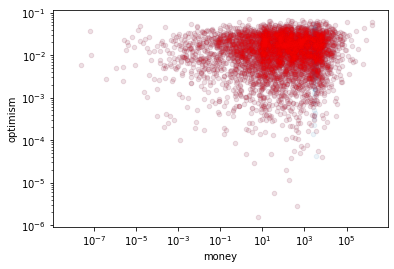

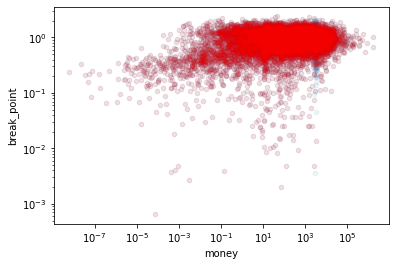

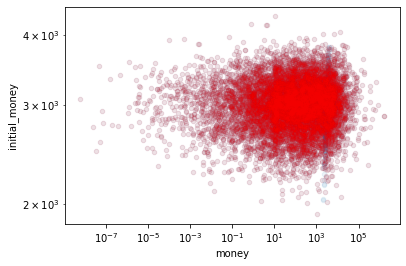

In [365]:
alpha = 0.08
idf = pd.DataFrame(res['past_impact_weight'][1.0]['investors'])
print(idf.columns)

def plot_corr(idf_, xcol, ycol):
    ax = idf_.plot.scatter(xcol, ycol, alpha=alpha, logx=True, logy=True)
    return idf_[idf_.money != idf_.initial_money].plot.scatter(xcol, ycol, alpha=alpha, logx=True, ax=ax, c='red')

plot_corr(idf, 'money', 'optimism')
plot_corr(idf, 'money', 'break_point')
plot_corr(idf, 'money', 'initial_money')

idf.corr()['money'].drop(['I', 'R', 'shares', 'money'])

### Substitution of 2 values

In [ ]:
def compute_hyperparam_subspace(args):
    res = defaultdict(dict)
    name, vals = args
    parts = 1000
    plt.show()
    for part in tqdm(range(parts), desc=f'{name}'):
        params = copy(nice_params)
        params['iterations'] = 2000
        params[name] = vals[0] + (vals[1] - vals[0]) * part / (parts - 1)
        res[name][params[name]] = test_hypervars(**params, return_df=True)
    return res

with multiprocessing.Pool() as p:
#     res = list(tqdm(p.imap(compute_hyperparam_subspace, pbounds.items()), total=len(pbounds.items()), desc='bounds'))
    res = p.map(compute_hyperparam_subspace, pbounds.items())
    
res = {list(x.keys())[0]: list(x.values())[0] for x in res}

### Explore peaks

Peaks are: 22
Peaks are: 19
Peaks are: 8
Peaks are: 8
Peaks are: 12
Peaks are: 8
Peaks are: 7
Peaks are: 8
Peaks are: 6
Peaks are: 5
Peaks are: 4
Peaks are: 4
Peaks are: 4
Peaks are: 6
Peaks are: 3
Peaks are: 3
Peaks are: 2
Peaks are: 2
Peaks are: 2
Peaks are: 2
Peaks are: 2
Peaks are: 2


/opt/conda/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


Peaks are: 4
Peaks are: 4
Peaks are: 8
Peaks are: 9
Peaks are: 4
Peaks are: 7
Peaks are: 3
Peaks are: 3
Peaks are: 5
Peaks are: 1
Peaks are: 5
Peaks are: 1
Peaks are: 4
Peaks are: 1
Peaks are: 1
Peaks are: 2
Peaks are: 1
Peaks are: 1


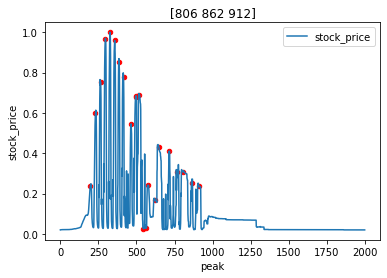

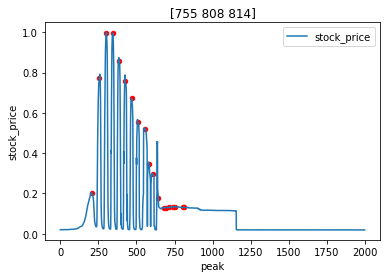

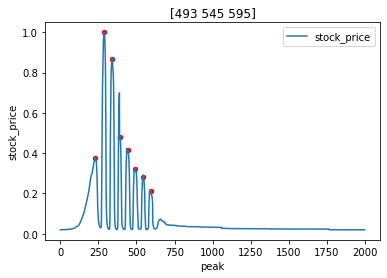

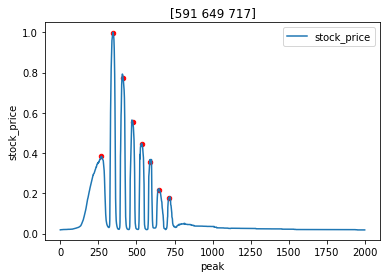

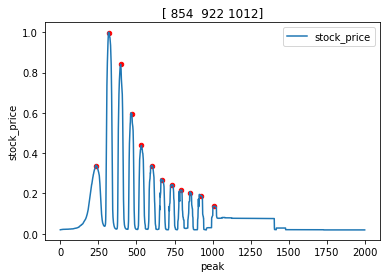

...

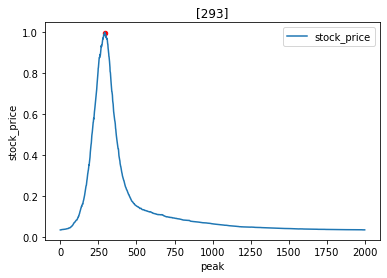

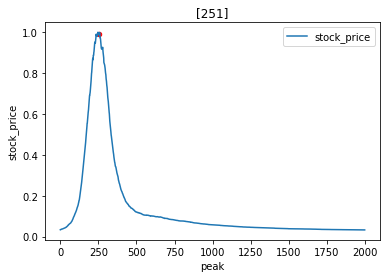

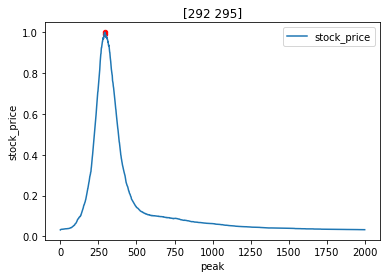

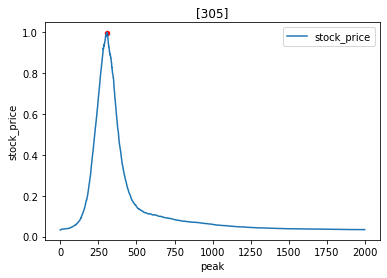

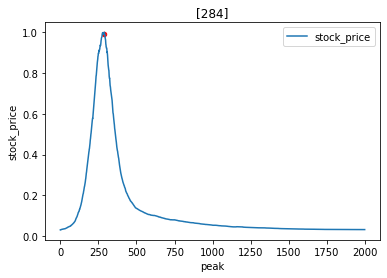

In [367]:
def show_peaks(df_):
    indexes = get_peaks(df_['stock_price'], metric_params)
    print('Peaks are: %s' % (len(indexes)))
    df_['peak'] = np.nan
    df_.loc[indexes, 'peak'] = indexes
    ax = df_[['stock_price']].plot(title=f'{indexes[-3:]}')
    df_.plot.scatter('peak', 'stock_price', c='red', ax = ax)
    
_ = df.iloc[::10].df.map(lambda cell: show_peaks(cell / cell.max()))

## Export

In [582]:
mkdir data

In [583]:
df = tdf.params.apply(pd.Series)
df['target'] = -tdf.target
df['params'] = tdf.params
df.to_csv('data/hyper_search.csv')

## Seek

In [603]:
tdf.iloc[1].params

{'behavior_linearity_exp': 1.0320255797616666,
 'behavior_scale': 16.760885575207098,
 'boredom_prob_exp': -3.8549999999999995,
 'delta_price_exp': -0.39336240792311106,
 'free_money_multiple': 89.488146211299,
 'mean_break_point_exp': -0.5155304236497467,
 'past_impact_weight': 22.021992339162843,
 'std_break_point_exp': -1.8825377791891666,
 'std_optimism_exp': -1.3247462366294098,
 'stock_buy_extra_exp': -4.475804412574341,
 'transmission_prob_exp': -3.0,
 'iterations': 8000}

{'behavior_linearity_exp': 0.8991988036871423, 'behavior_scale': 12.879743533907462, 'boredom_prob_exp': -2.260024747314643, 'delta_price_exp': -4.71538850538222, 'free_money_multiple': 74.79662886481293, 'mean_break_point_exp': -1.710672128971542, 'past_impact_weight': 9.43875284292932, 'std_break_point_exp': -0.8390333696293673, 'std_optimism_exp': -1.4210456518658683, 'stock_buy_extra_exp': -4.2283366746549795, 'transmission_prob_exp': -1.1440013754699723}
loss=-54.27101230989384 mid=5.0


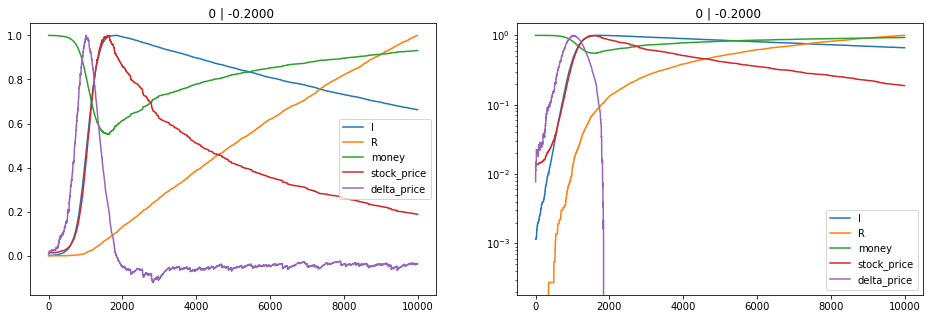

loss=-60.568671813689676 mid=7.499750000000001


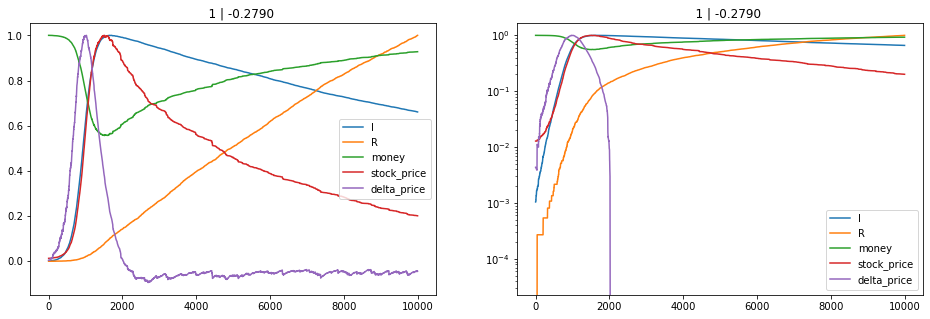

loss=-31.451453735406577 mid=8.7495000125


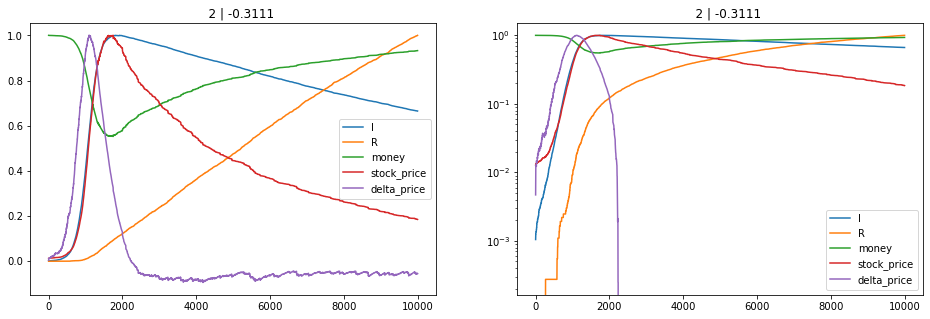

loss=-79.96391251938725 mid=9.374312531249375


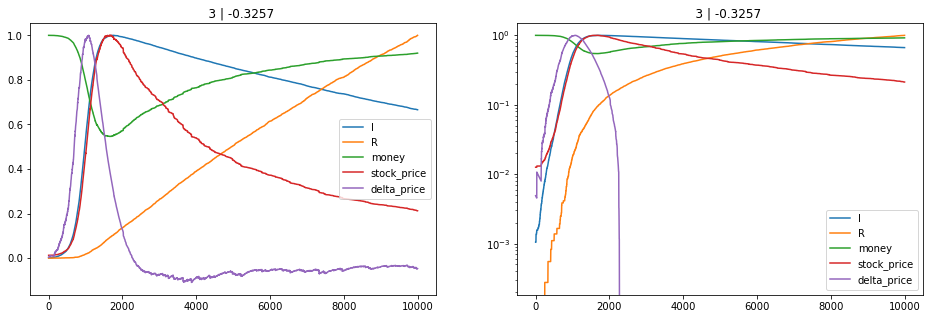

loss=-33.358183196494764 mid=9.686687549998126


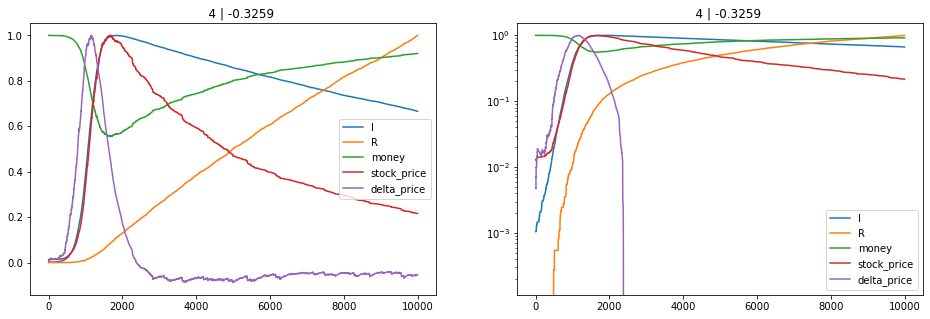

loss=-63.61072475686885 mid=9.842859440621563


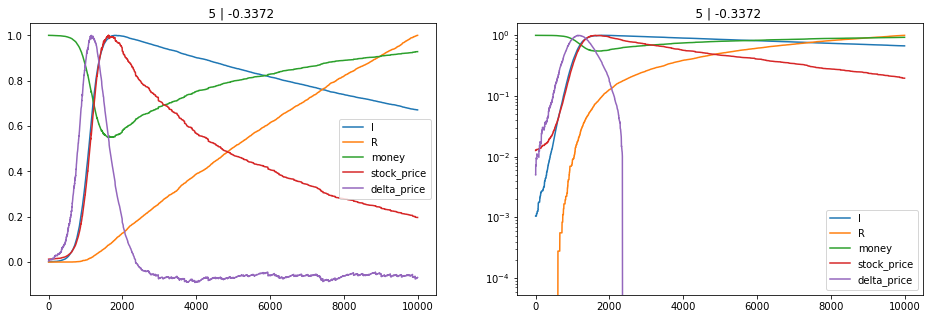

loss=-51.20867552031321 mid=9.920937577338751


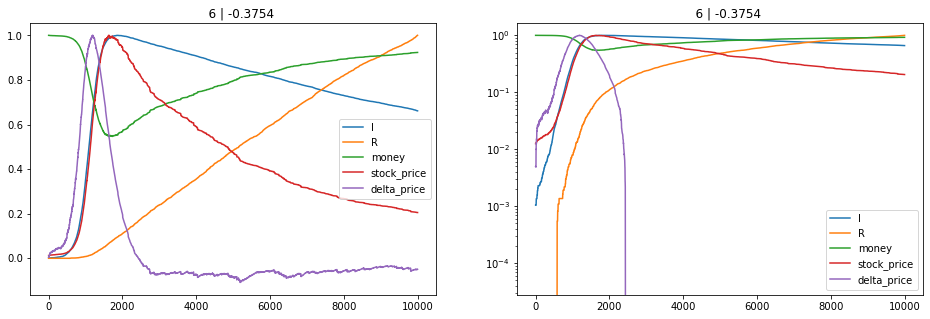

loss=-27.221697313925084 mid=9.959972741790509


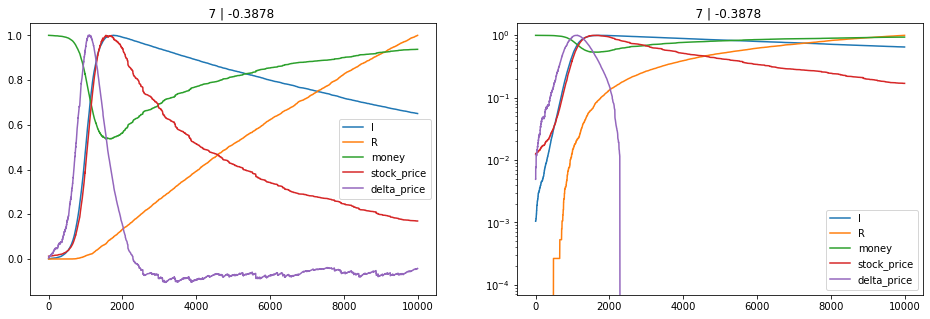

loss=-48.542904896101724 mid=9.940457111322853


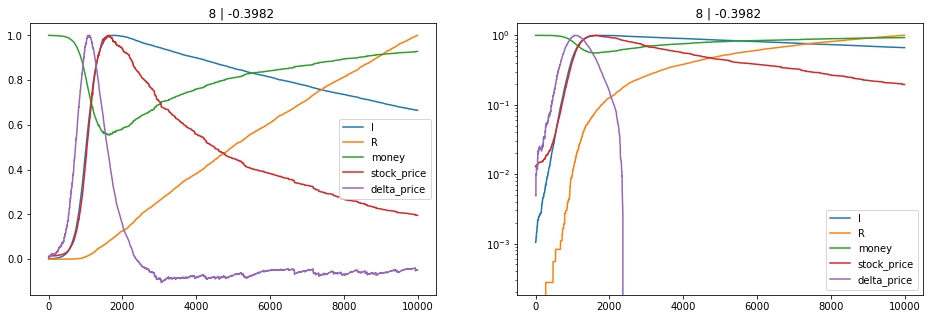

loss=-18.191883973635704 mid=9.950215902338204


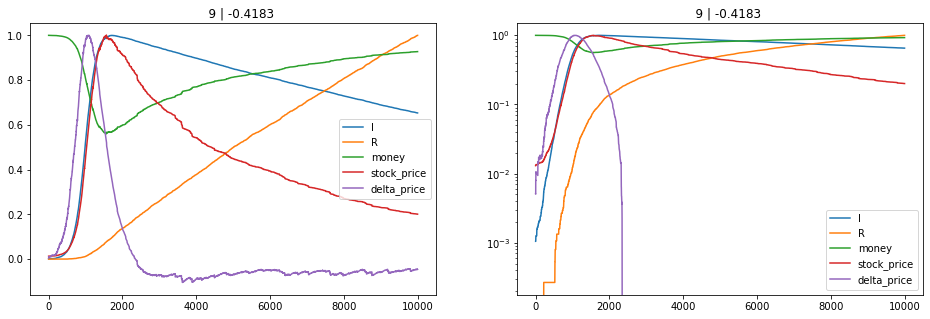

In [ ]:
i = 2
params = copy(tdf.params.iloc[i])
print(params)
m = 1.9
params['transmission_prob_exp'] = -1.1440013754699723 * m
params['boredom_prob_exp'] = -2.260024747314643 * m
params['iterations'] = 10000
params['behavior_scale'] = 12.879743533907462 / m
params['behavior_linearity_exp'] = 0.8991988036871423 / m
params['past_impact_weight'] = 22.021992339162843 * m * 1.42

a, b = 0, 10

for i in range(20):
    mid = (a + b) / 2
    params['past_impact_weight'] = 22.021992339162843 * m * mid
    loss = test_hypervars(**params, plot=True, title=f'{i:5} | {tdf.target.iloc[i]:2.4f}')
    print(f'{loss=} {mid=}')
    plt.show()
    if -loss > 30:
        # too many
        a = mid * (1 - eps)
    else:
        b = mid * (1 + eps)

# Playground

<iframe src="https://www.geogebra.org/geometry/eehs5tpw?embed" width="100%" height="600" allowfullscreen style="border: 1px solid #e4e4e4;border-radius: 4px;" frameborder="0"></iframe>